# Name : Manish Jayswal
# SR No.: 18844
# Degree : M.Tech Coursework(CDS)
# Subject : Numerical Optimization Assignment#2

# Q(1)

In [1]:
#Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from numpy.linalg import norm

In [2]:
# Given Matrices A1 and A2
A1 = np.array([[1,0],[0,1]])
A2 = np.array([[10,8],[8,10]])
# X1 = np.array([[2,0]]).T
# X2 = np.array([[2,2]]).T

#Given Constants c and rho
c = 10**(-4)
rho = 0.9

In [3]:
# Given functions f1 and f2
def f1(X):
    return(X.T @ A1 @ X)/2
def f2(X):
    return (X.T @ A2 @ X)/2

# Jacobi of given functions f1 and f2
def df1(X):
    return(A1 @ X)
def df2(X): 
    return(A2 @ X)

# Hessian of given functions f1 and f2
def d2f1(X):
    return A1
def d2f2(X):
    return A2

In [4]:
#step length calculator
#for f1
def Compute_StepLength1(X,alpha_bar,p):
    while(f1(X + alpha_bar*p) > (f1(X) + c*alpha_bar* df1(X).T @ p)):
        alpha_bar = rho * alpha_bar
    return alpha_bar
#for f2
def Compute_StepLength2(X,alpha_bar,p):
    while(f2(X + alpha_bar*p) > (f2(X) + c*alpha_bar* df2(X).T @ p)):
        alpha_bar = rho * alpha_bar
    return alpha_bar

In [5]:
#function for calculating Z for contour plot
def func(x, y, A):
    return (A[0,0] * x**2 + (A[0,1] + A[1,0]) * x * y + A[1,1] * y**2)/2 

# 1.1

# Steepest Descent for f1 at (2,0) and (2,2)

Using Steepest Descent Method: 
For the initial guess x = (2,0) for Function1: 
The solution x* =(0.001334007445319771,0.0) and 
The number of iterations to converge is 46



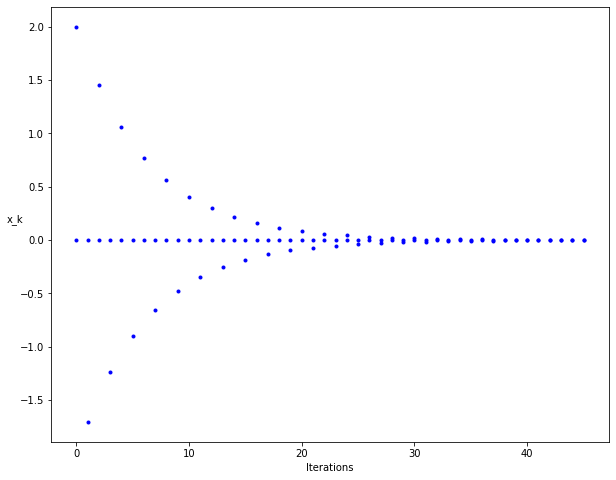

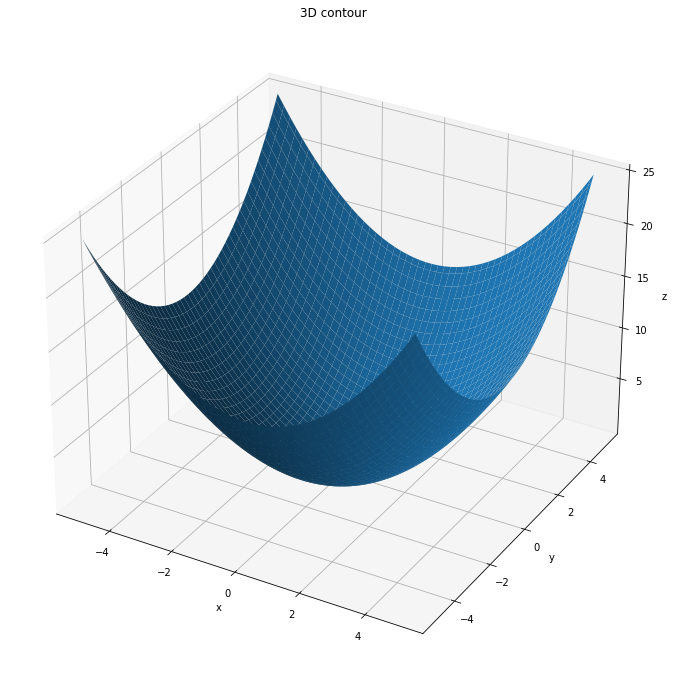

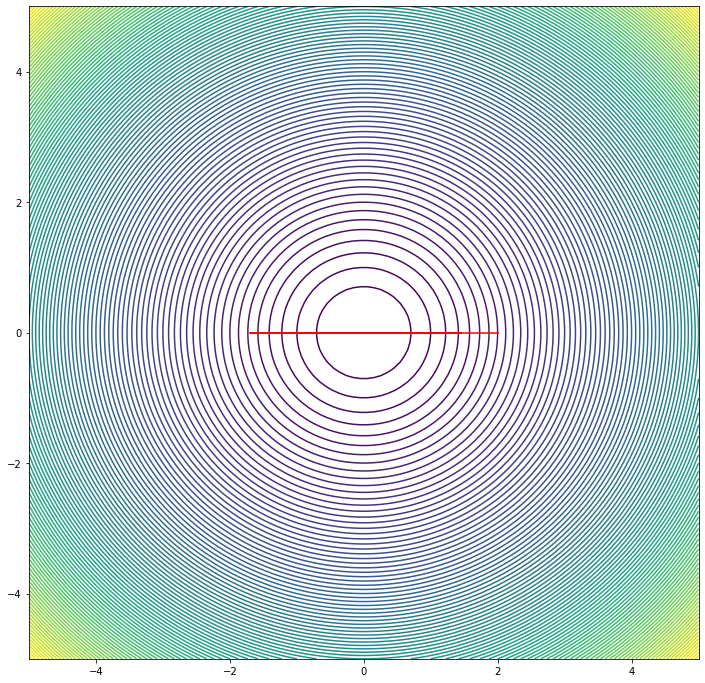

Using Steepest Descent Method: 
For the initial guess x = (2,2) for Function1: 
The solution x* =(0.0009706817699516091,0.0009706817699516091) and 
The number of iterations to converge is 48



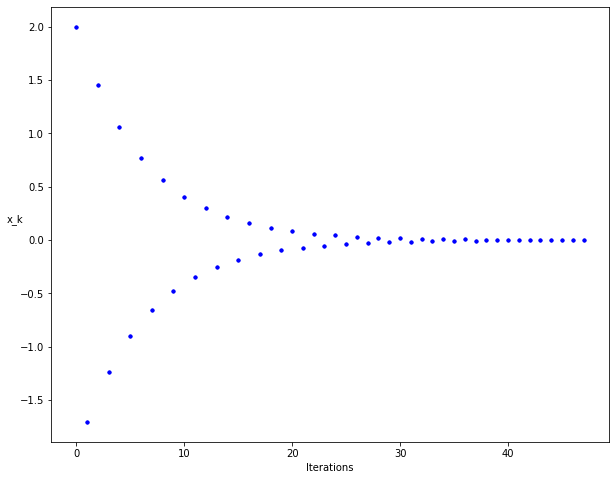

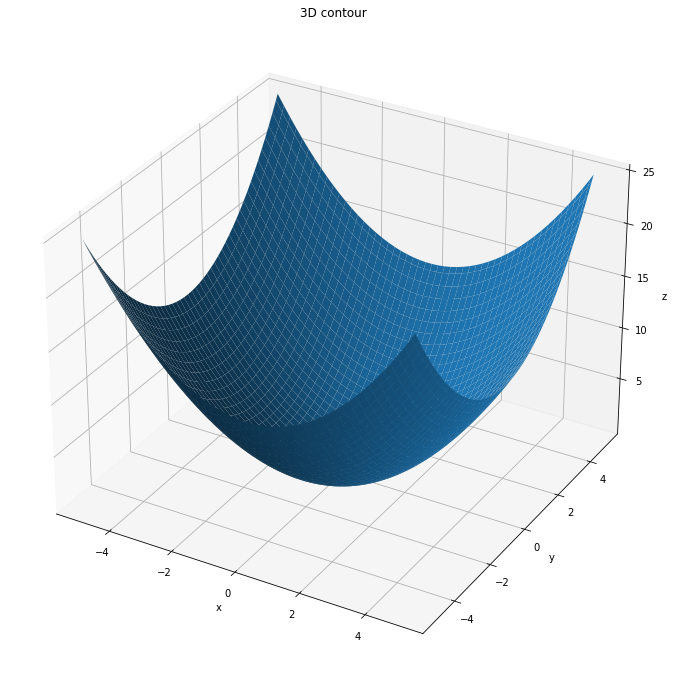

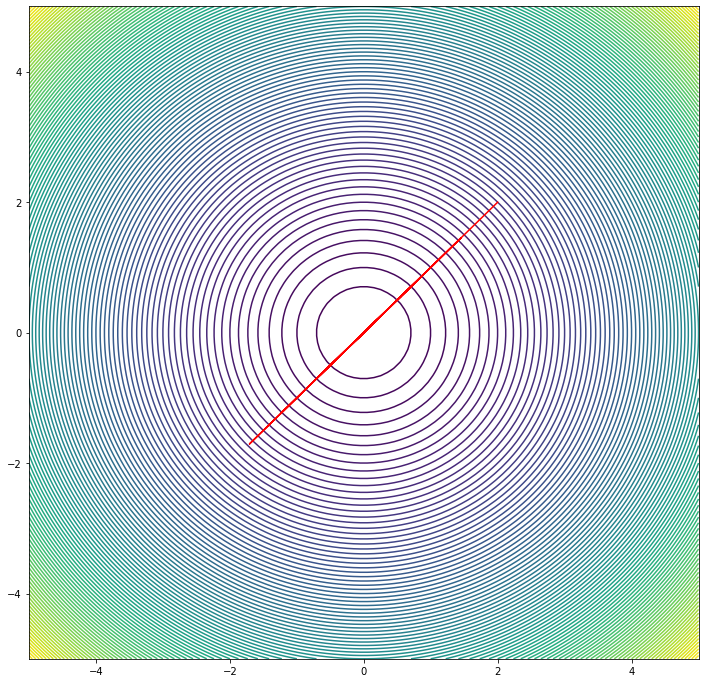

In [6]:
#Steepest Descent for f1 at (2,0) and (2,2)
Y = np.array([[2,2],[0,2]]).T
for y in Y:
    X1 = y
    p = -df1(X1)
    counter = 0
#     print('P{}:\n{}'.format(counter,p))
    alpha_bar = 10
    alpha = Compute_StepLength1(X1,alpha_bar,p)
    X_list = [X1]
#     print(alpha)
    X = X1 + alpha*p
#     print("X{0}:\n{1}".format(counter,X))
    while(norm((X-X1),2)**2 >=10**(-5)):
        X1 = X
        X_list.append(X1)
        p = -df1(X1)
        counter = counter + 1
#         print('\nP{}:\n{}'.format(counter,p))
        alpha_bar = alpha
        alpha = Compute_StepLength1(X1,alpha_bar,p)
#         print("Alpha:",alpha)
        X = X1 + alpha*p
#         print("X{}:\n{}".format(counter,X))
#     print("X{}:\n{}".format(counter,X))
    print("Using Steepest Descent Method: \nFor the initial guess x = ({},{}) for Function1: \nThe solution x* =({},{}) and \nThe number of iterations to converge is {}\n".format(y[0],y[1],X[0],X[1],counter+1))
    
    x = np.linspace(-5, 5, 100)
    y = np.linspace(-5, 5, 100)
    Xm,Ym = np.meshgrid(x,y)
    Z = func(Xm, Ym, A1) 
    X_array = np.reshape(np.array(X_list),newshape=(np.array(X_list).shape[0],2))

    fig,ax = plt.subplots(figsize=(10,8))
    ax.set_ylabel('x_k',rotation=0)
    ax.set_xlabel('Iterations')
    _=ax.plot(range(counter+1),X_list,'b.')
    
    figure = plt.figure(figsize=[12,12])
    ax = figure.gca(projection='3d')
    ax.plot_surface(Xm, Ym, Z)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.set_title('3D contour')
    
    figure2 = plt.figure(figsize=[12,12])
    plt.contour(Xm, Ym, Z,100)
    plt.plot(X_array[:,0], X_array[:,1],"r-")
    plt.show()
    


Using Steepest Descent Method: 
For the initial guess x = (2,0) for Function2: 
The solution x* =(0.001049686200332947,0.0010496861952521345) and 
The number of iterations to converge is 110



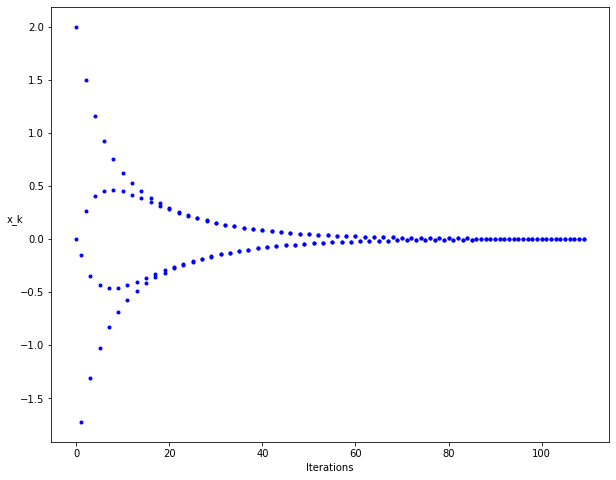

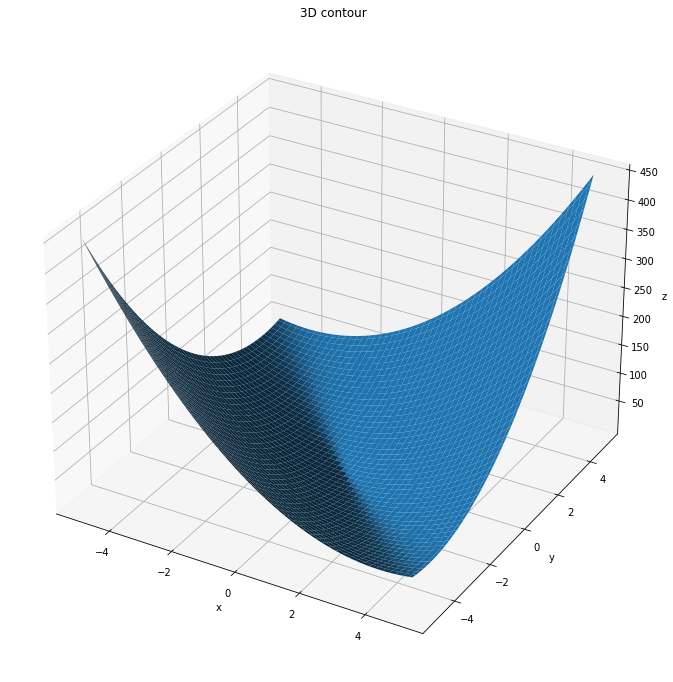

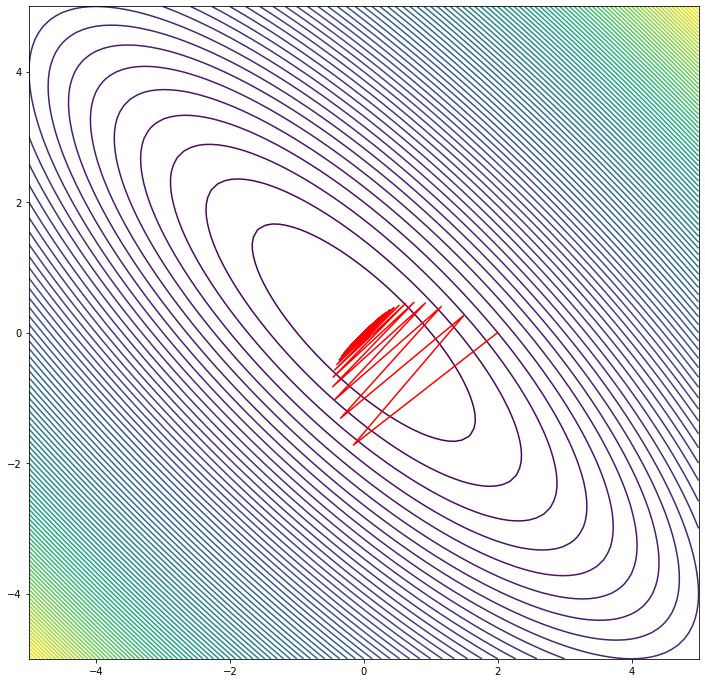

Using Steepest Descent Method: 
For the initial guess x = (2,2) for Function2: 
The solution x* =(-0.0010572931806357541,-0.0010572931806357541) and 
The number of iterations to converge is 121



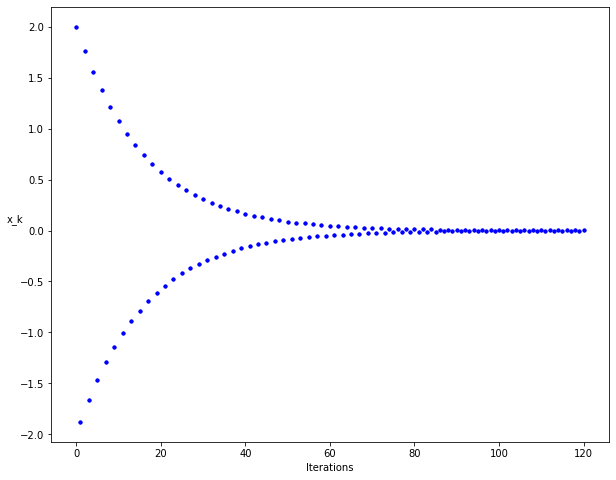

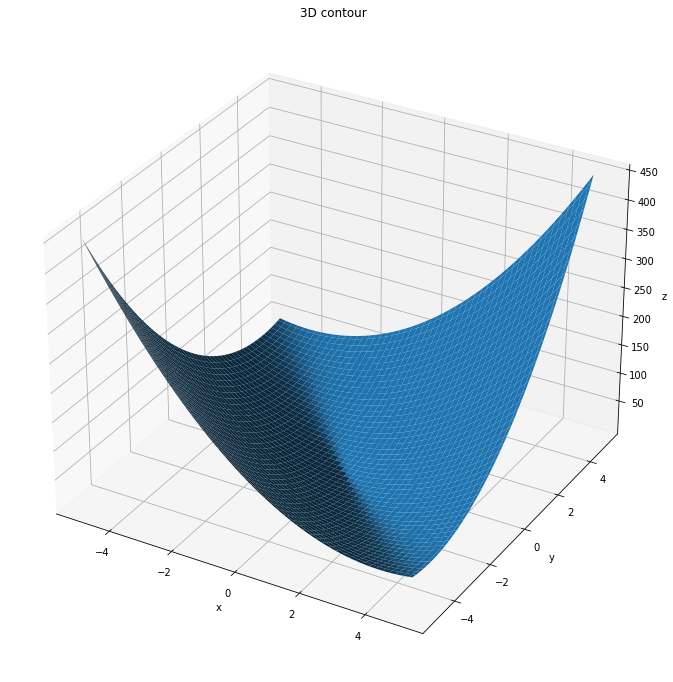

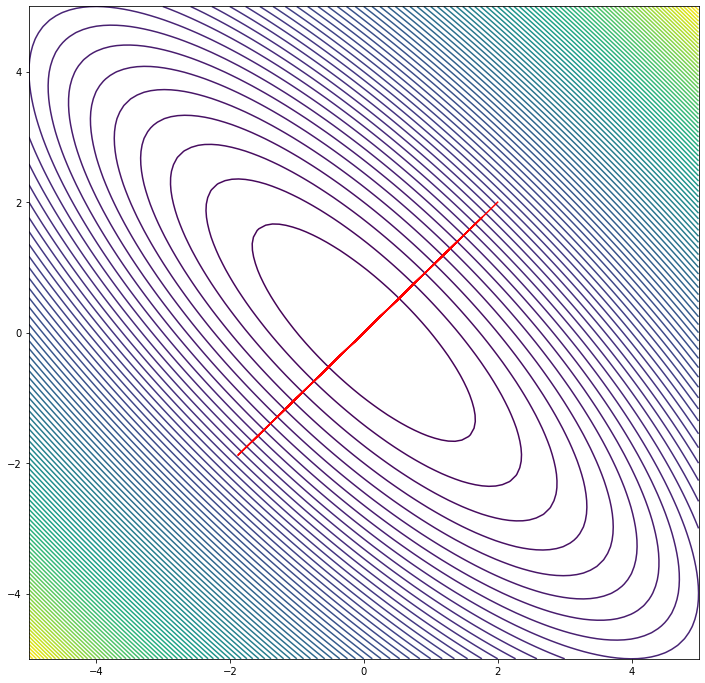

In [7]:
#Steepest Descent for f2 at (2,0) and (2,2)
Y = np.array([[2,2],[0,2]]).T
for y in Y:
    X1 = y
    p = -df2(X1)
    counter = 0
    alpha_bar = 10
    alpha = Compute_StepLength2(X1,alpha_bar,p)
    X_list = [X1]
    X = X1 + alpha*p
    while(norm((X-X1),2)**2 >=10**(-5)):
        X1 = X
        X_list.append(X1)
        p = -df2(X1)
        counter = counter + 1
        alpha_bar = alpha
        alpha = Compute_StepLength2(X1,alpha_bar,p)
        X = X1 + alpha*p
    print("Using Steepest Descent Method: \nFor the initial guess x = ({},{}) for Function2: \nThe solution x* =({},{}) and \nThe number of iterations to converge is {}\n".format(y[0],y[1],X[0],X[1],counter+1))
#     print(X_list)
    x = np.linspace(-5, 5, 100)
    y = np.linspace(-5, 5, 100)
    Xm,Ym = np.meshgrid(x,y)
    Z = func(Xm, Ym, A2) 
    X_array = np.reshape(np.array(X_list),newshape=(np.array(X_list).shape[0],2))

    
    fig,ax = plt.subplots(figsize=(10,8))
    ax.set_ylabel('x_k',rotation=0)
    ax.set_xlabel('Iterations')
    _=ax.plot(range(counter+1),X_list,'b.')
    
    figure = plt.figure(figsize=[12,12])
    ax = figure.gca(projection='3d')
    ax.plot_surface(Xm, Ym, Z)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.set_title('3D contour')
    
    figure2 = plt.figure(figsize=[12,12])
    plt.contour(Xm, Ym, Z,100)
    plt.plot(X_array[:,0], X_array[:,1],"r-")
    plt.show()
    

# 1.2 Finding minima $x^*$ for the given functions $f_1 (x)$ and $ f_2 (x)$ using Newton's method

Using Newton's Method: 
For the initial guess x = (2,0) for Function1: 
The solution x* =(0.0,0.0) and 
The number of iterations to converge is 2



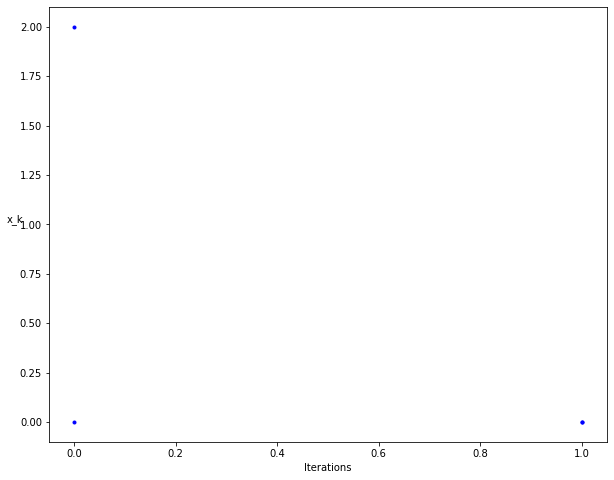

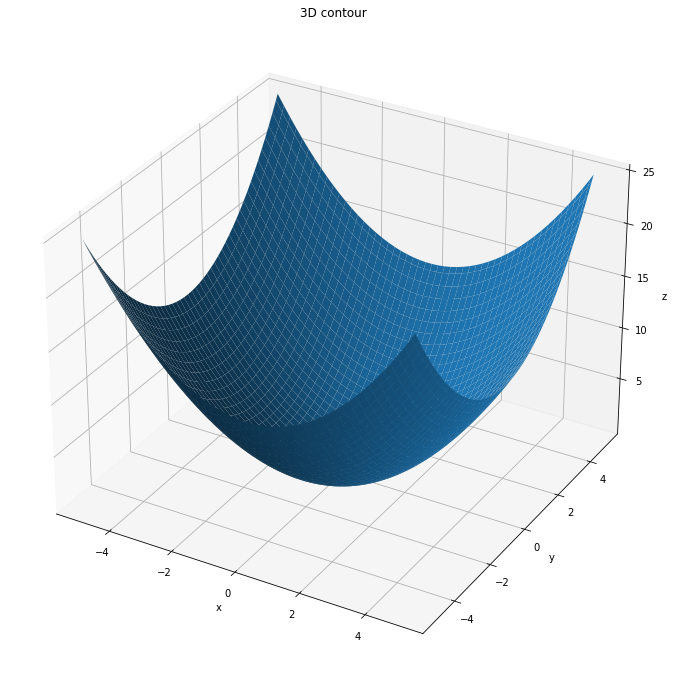

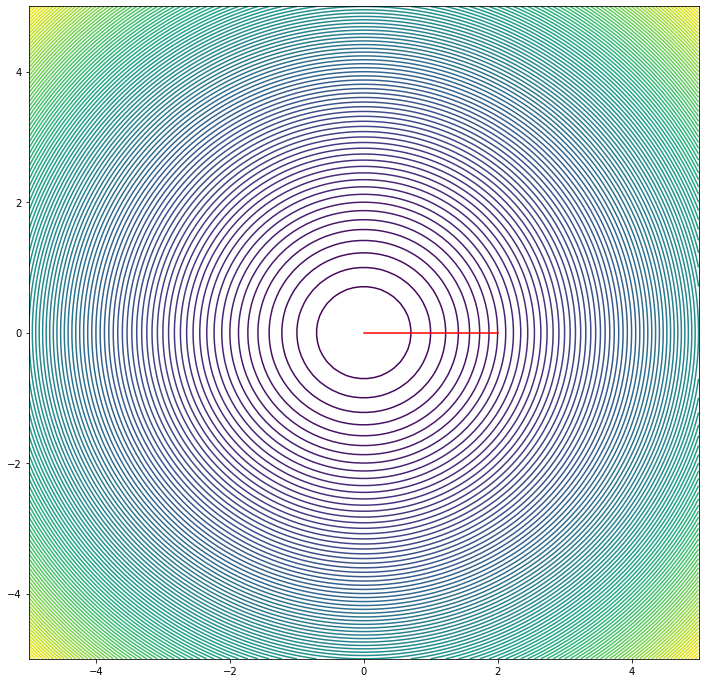

Using Newton's Method: 
For the initial guess x = (2,2) for Function1: 
The solution x* =(0.0,0.0) and 
The number of iterations to converge is 2



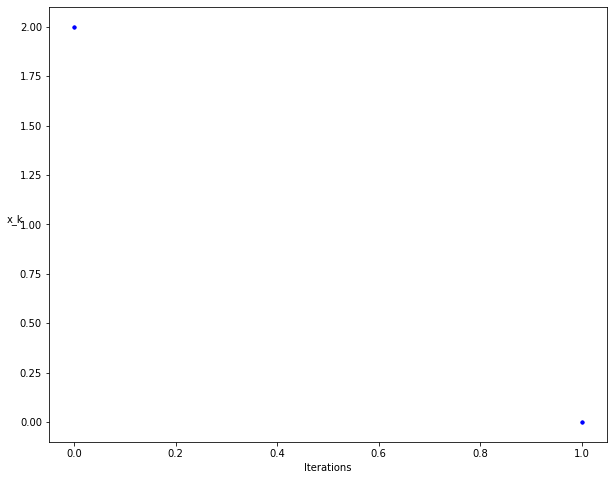

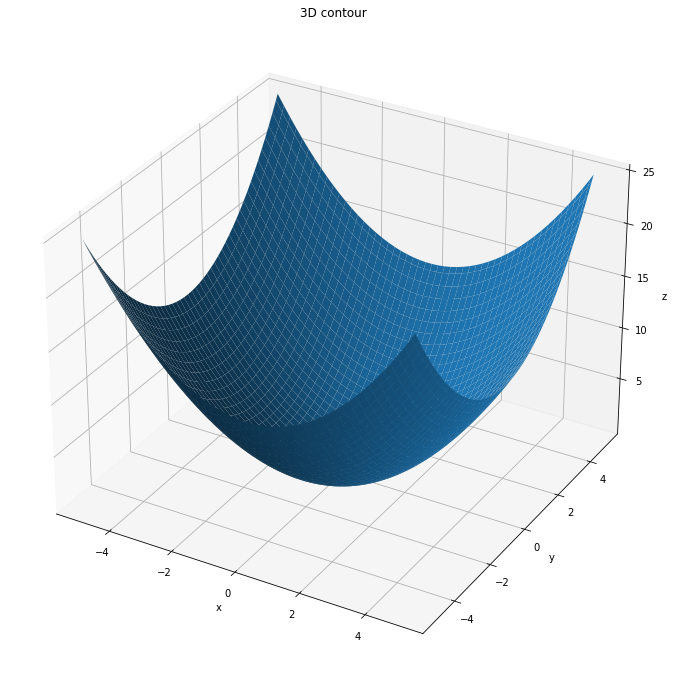

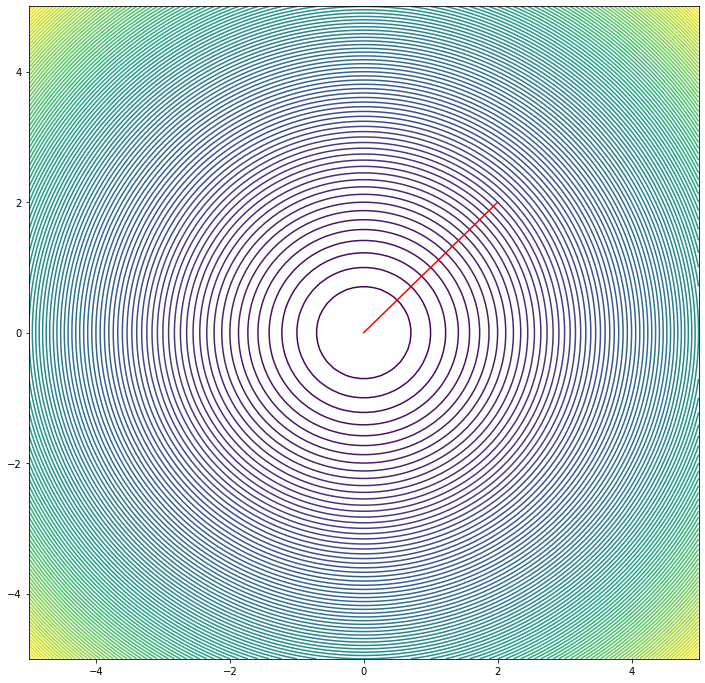

In [8]:
#Newton's method for f1 at (2,0) and (2,2)
Y = np.array([[2,2],[0,2]]).T
for y in Y:
    X1 = y
    p = - np.linalg.inv(d2f1(X1)) @ df1(X1)
    counter = 0
    alpha_bar = 1
    alpha = Compute_StepLength1(X1,alpha_bar,p)
    X_list = [X1]
    X = X1 + alpha*p
    while(norm((X-X1),2)**2 >=10**(-5)):
        X1 = X
        X_list.append(X1)
        p = - np.linalg.inv(d2f1(X1)) @ df1(X1)
        counter = counter + 1
        alpha_bar = alpha
        alpha = Compute_StepLength1(X1,alpha_bar,p)
        X = X1 + alpha*p
    print("Using Newton's Method: \nFor the initial guess x = ({},{}) for Function1: \nThe solution x* =({},{}) and \nThe number of iterations to converge is {}\n".format(y[0],y[1],X[0],X[1],counter+1))
    x = np.linspace(-5, 5, 100)
    y = np.linspace(-5, 5, 100)
    Xm,Ym = np.meshgrid(x,y)
    Z = func(Xm, Ym, A1) 
    X_array = np.reshape(np.array(X_list),newshape=(np.array(X_list).shape[0],2))

    
    fig,ax = plt.subplots(figsize=(10,8))
    ax.set_ylabel('x_k',rotation=0)
    ax.set_xlabel('Iterations')
    _=ax.plot(range(counter+1),X_list,'b.')
    
    figure = plt.figure(figsize=[12,12])
    ax = figure.gca(projection='3d')
    ax.plot_surface(Xm, Ym, Z)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.set_title('3D contour')
    
    figure2 = plt.figure(figsize=[12,12])
    plt.contour(Xm, Ym, Z,100)
    plt.plot(X_array[:,0], X_array[:,1],"r-")
    plt.show()
    

Using Newton's Method: 
For the initial guess x = (2,0) for Function2: 
The solution x* =(0.0,2.465190328815662e-32) and 
The number of iterations to converge is 2



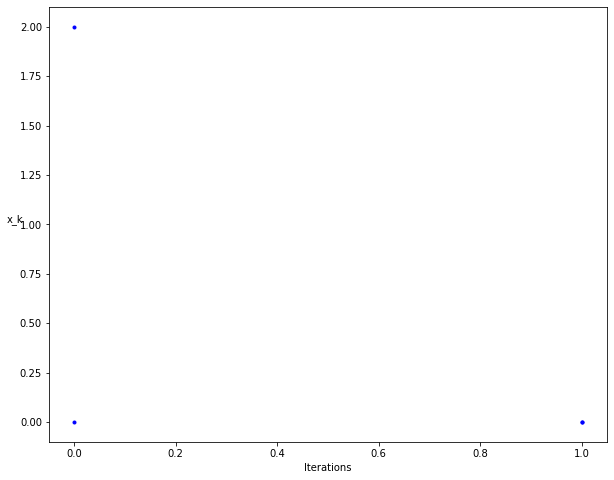

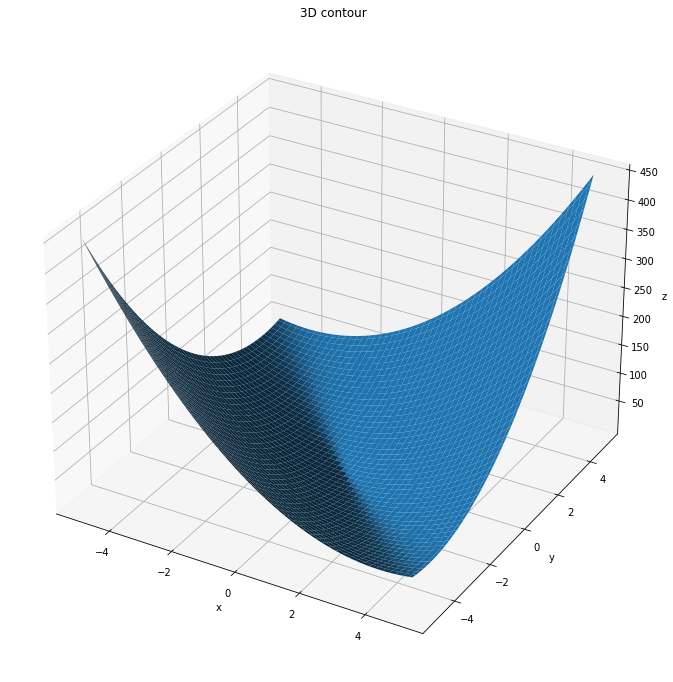

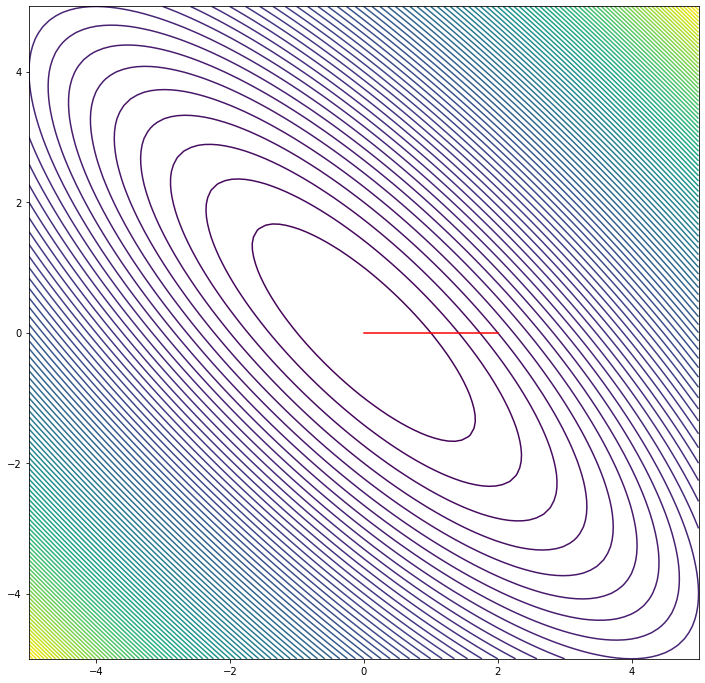

Using Newton's Method: 
For the initial guess x = (2,2) for Function2: 
The solution x* =(0.0,0.0) and 
The number of iterations to converge is 2



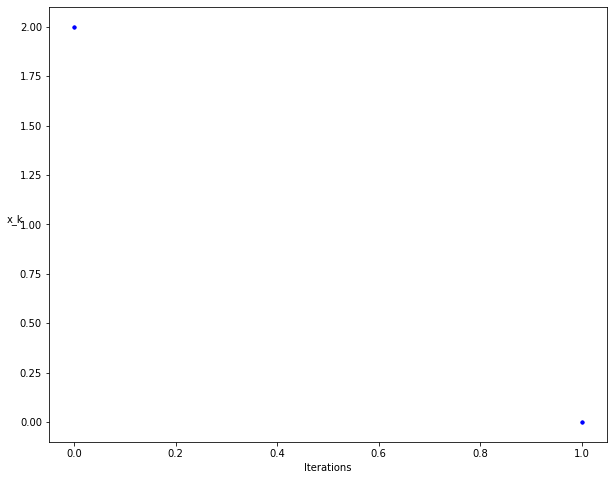

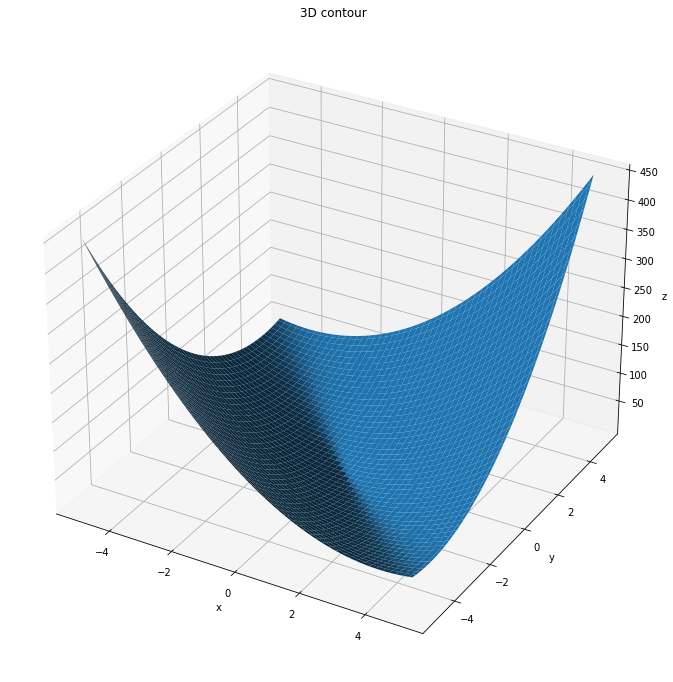

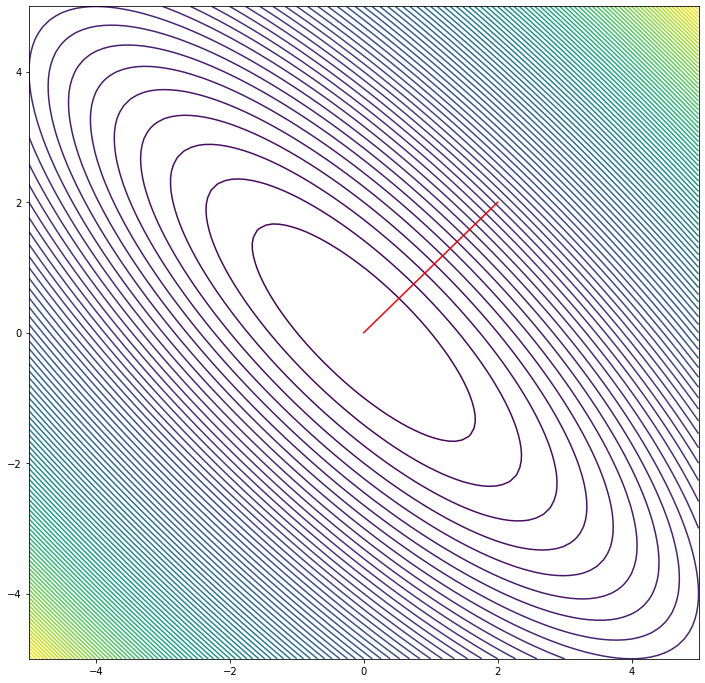

In [9]:
#Newton's method for f2 at (2,0) and (2,2)
Y = np.array([[2,2],[0,2]]).T
for y in Y:
    X1 = y
    p = - np.linalg.inv(d2f2(X1)) @ df2(X1)
    counter = 0
    alpha_bar = 1
    alpha = Compute_StepLength2(X1,alpha_bar,p)
    X_list = [X1]
    X = X1 + alpha*p
    while(norm((X-X1),2)**2 >=10**(-5)):
        X1 = X
        X_list.append(X1)
        p = - np.linalg.inv(d2f2(X1)) @ df2(X1)
        counter = counter + 1
        alpha_bar = alpha
        alpha = Compute_StepLength2(X1,alpha_bar,p)
        X = X1 + alpha*p
    print("Using Newton's Method: \nFor the initial guess x = ({},{}) for Function2: \nThe solution x* =({},{}) and \nThe number of iterations to converge is {}\n".format(y[0],y[1],X[0],X[1],counter+1))
    x = np.linspace(-5, 5, 100)
    y = np.linspace(-5, 5, 100)
    Xm,Ym = np.meshgrid(x,y)
    Z = func(Xm, Ym, A2) 
    X_array = np.reshape(np.array(X_list),newshape=(np.array(X_list).shape[0],2))

    
    fig,ax = plt.subplots(figsize=(10,8))
    ax.set_ylabel('x_k',rotation=0)
    ax.set_xlabel('Iterations')
    _=ax.plot(range(counter+1),X_list,'b.')
    
    figure = plt.figure(figsize=[12,12])
    ax = figure.gca(projection='3d')
    ax.plot_surface(Xm, Ym, Z)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.set_title('3D contour')
    
    figure2 = plt.figure(figsize=[12,12])
    plt.contour(Xm, Ym, Z,100)
    plt.plot(X_array[:,0], X_array[:,1],"r-")
    plt.show()
    

# Comment on reported number of iterations.

Here, Using Steepest Descent Method takes more number of iterations to converge to the result while Newton's Line Search method converges in just 2 iterations. Also, for matrix A being Identity, matrix we can observe that it takes comparatively less iterations than when matrix A is non-identity.

# Q(2)

In [10]:
# Importing Libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from numpy.linalg import norm

In [11]:
#loading dataset
data = np.load('PS2_q2_data.npy')
x = data.T[0]
y = data.T[1]

In [12]:
X = x.reshape(-1,1)
Y = y.reshape(-1,1)

In [13]:
# Given functions f1
def f1(z):
    return((z.T @ A @ z)/2 + b.T @ z + c )

# Jacobi of given functions f1 
def df1(z):
    return(A @ z + b)


#Given Constants c and rho
c1 = 10**(-4)
rho = 0.9

#step length calculator for f1
def Compute_StepLength1(z, alpha_bar, p):
    while(f1(z + alpha_bar*p) > (f1(z) + c1*alpha_bar* df1(z).T @ p)):
        alpha_bar = rho * alpha_bar
    return alpha_bar

## 2.1. Formulating the quadratic loss function for the Mean Squared Error of the general form $\frac{1}{2} z^T A z  + b^T z + c$, where $z = [p, q]^T$. Write $A$ and $b$ in terms of $X$ and $Y$. Also re-write the same in terms of $x_i, y_i, p$ and $q$

let us consider $ A = \begin{bmatrix}d & e\\e & f\end{bmatrix} $
and $ b = \begin{bmatrix} g \\ h \end{bmatrix}$


Then, $ \frac{1}{2}z^T A z + b^T z + c = \frac{1}{N}\sum_{i=1}^{N}(\hat{y} - y_i)^2  $
 
 $ => \frac{1}{2}\begin{bmatrix}p & q\end{bmatrix} \begin{bmatrix} d & e \\e & f\end{bmatrix}\begin{bmatrix}p \\ q\end{bmatrix} + \begin{bmatrix}g & h\end{bmatrix}\begin{bmatrix}p \\ q\end{bmatrix} + c = \frac{1}{N}\sum_{i=1}^{N}(px_i + q - y_i)^2  $
 
 $ => \frac{1}{2}\begin{bmatrix}p & q\end{bmatrix}\begin{bmatrix}dp+eq \\ ep+fq\end{bmatrix} + (gp+hq) + c = \frac{1}{N}\sum_{i=1}^N (p^2 x_i^2 + q^2 + y_i^2 + 2pqx_i - 2px_i y_i - 2qy_i )$

$ => \frac{1}{2} (dp^2+epq+epq+fq^2) + (gp + hq) + c = \frac{1}{N}\sum_{i=1}^N (p^2 x_i^2 + q^2 + y_i^2 + 2pqx_i - 2px_i y_i - 2qy_i )$

comparing both sides, we get 

$ d = \frac{2}{N}\sum_{i=2}^N x_i^2 $

$ e = \frac{2}{N}\sum_{i=2}^N x_i $

$ f = \frac{2}{N}\sum_{i=2}^N 1 = 2 $

$ g = \frac{-2}{N}\sum_{i=2}^N x_i y_i $

$ h = \frac{-2}{N}\sum_{i=2}^N y_i $

$ c = \frac{1}{N}\sum_{i=2}^N y_i^2 $

Now writing A and b in terms of X and Y, we have

$ A =  \begin{bmatrix}\frac{2}{N}X^T X & 2X.mean \\ 2X.mean & 2 \end{bmatrix} $

$ b = \begin{bmatrix}\frac{-2}{N}X^T Y \\ -2Y.mean  \end{bmatrix} $

Again, writing A and b in terms of $x_i , y_i $, p  and  p, we get

$ A =\begin{bmatrix}\frac{2}{N}\sum_{i=2}^N x_i^2 & \frac{2}{N}\sum_{i=2}^N x_i \\ \frac{2}{N}\sum_{i=2}^N x_i & 2 \end{bmatrix} $

$ b = \begin{bmatrix}\frac{-2}{N}\sum_{i=2}^N x_i y_i \\ \frac{-2}{N}\sum_{i=2}^N y_i  \end{bmatrix}  $

In [14]:
#matrix A = [[d,e],[e,f]] 
d = (2 * X**2).mean()
e = 2*X.mean()
f = 2
c = (2 * Y**2).mean()

In [15]:
A = np.array([[d,e],[e,f]])
A

array([[6.80134680e-01, 1.64313008e-16],
       [1.64313008e-16, 2.00000000e+00]])

In [16]:
# vector b = [g h].T
g = -2*np.array([[x[i]*y[i] for i in range(len(X))]]).mean()
h = (-2*Y).mean()
b = np.array([[g,h]]).T
b

array([[-1.38277125],
       [-6.02423314]])

# (2.2) Implementation of Stochastic Gradient Descent

In [17]:
# Just to compare how close the computed(calculated using SGD) value of p and q are 
# calculating p and q using built in Linear Regression function for building the model 
model = LinearRegression().fit(X,y)
p1 = model.coef_
q1 = model.intercept_
print(p1)
print(q1)

[2.03308447]
3.01211657041514


In [18]:
def  cal_cost(z,X,y):    
    m = len(y)
    predictions = X.dot(z)
    cost = (1/2*m) * np.sum(np.square(predictions-y))
    return cost


In [19]:
def stochastic_GD(X, y, z, step_length=0.01, iterations=10):
    m = len(y)
    cost_history = np.zeros(iterations)
    z_list = [z]    
    for it in range(iterations):
        cost = 0.0
        for i in range(m):
            rand_ind = np.random.randint(0,m)
            X_i = X[rand_ind,:].reshape(1,X.shape[1])
            y_i = y[rand_ind].reshape(1,1)
            prediction = np.dot(X_i, z)
            z = z -(1/m) * step_length *( X_i.T.dot((prediction - y_i)))
            cost += cal_cost(z, X_i, y_i)
        cost_history[it]  = cost
        z_list.append(z)
    return z, cost_history, z_list


For Step length: 0.1 
p: 0.590,
q: 1.907
Final cost/MSE:  107.386


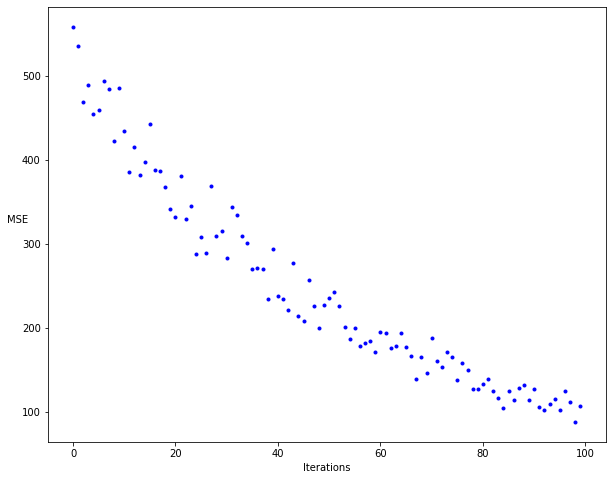

In [20]:
step_length = 0.01
n_iterations = 100
z = np.array([[0,0]]).T   # initial guess
X_b = np.c_[np.ones((len(X), 1)) ,X]
z, cost_history, z_list = stochastic_GD(X_b, y, z, step_length, n_iterations)
print('\nFor Step length: 0.1 \np: {:0.3f},\nq: {:0.3f}'.format(z[1][0], z[0][0]))
print('Final cost/MSE:  {:0.3f}'.format(cost_history[-1]))
fig,ax = plt.subplots(figsize=(10,8))

ax.set_ylabel('MSE',rotation=0)
ax.set_xlabel('Iterations')
_=ax.plot(range(n_iterations),cost_history,'b.')

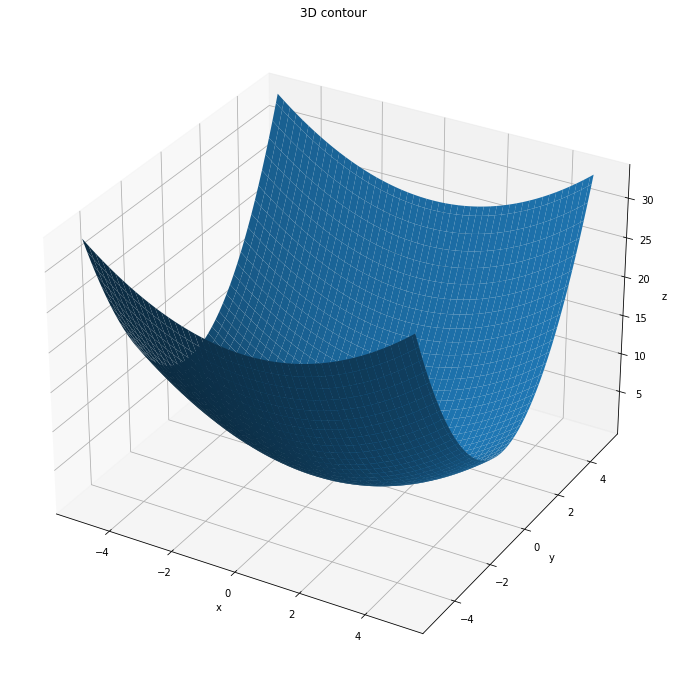

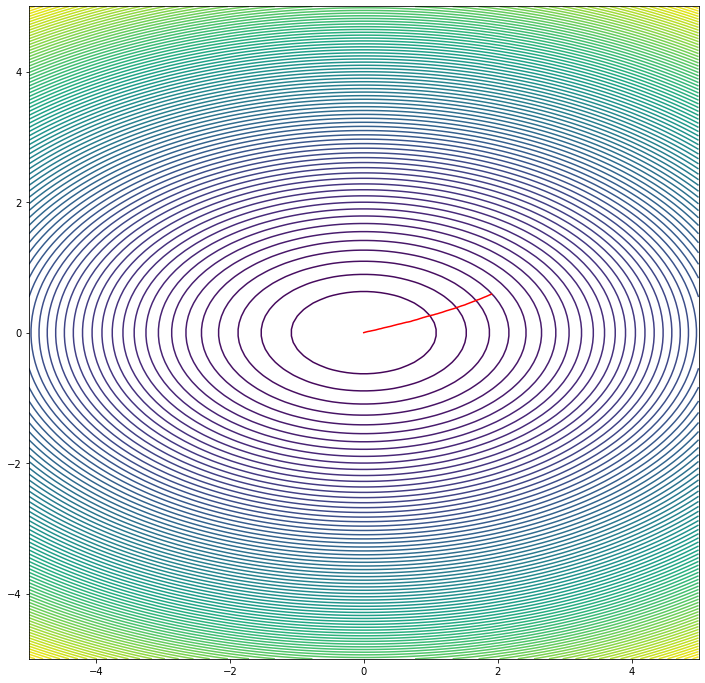

In [21]:
x2 = np.linspace(-5, 5, 100)
y2 = np.linspace(-5, 5, 100)
Xm,Ym = np.meshgrid(x2,y2)
Z = (A[0,0] * Xm**2 + (A[0,1] + A[1,0]) * Xm * Ym + A[1,1] * Ym**2)/2
X_array = np.reshape(np.array(z_list),newshape=(np.array(z_list).shape[0],2))

figure = plt.figure(figsize=[12,12])
ax = figure.gca(projection='3d')
ax.plot_surface(Xm, Ym, Z)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_title('3D contour')

figure2 = plt.figure(figsize=[12,12])
plt.contour(Xm, Ym, Z,100)
plt.plot(X_array[:,0], X_array[:,1],"r-")
plt.show()


For Step length: 0.1 
p: 1.964,
q: 3.018
Final cost/MSE:  1.634


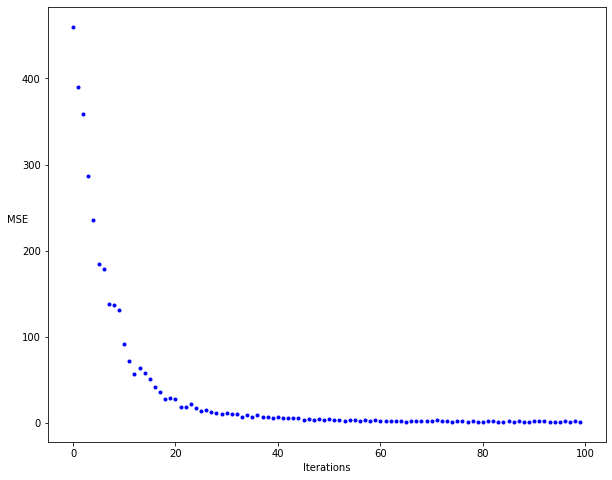

In [22]:
step_length = 0.1
n_iterations = 100
z = np.array([[0,0]]).T   # initial guess
X_b = np.c_[np.ones((len(X), 1)) ,X]
z, cost_history, z_list = stochastic_GD(X_b, y, z, step_length, n_iterations)
print('\nFor Step length: 0.1 \np: {:0.3f},\nq: {:0.3f}'.format(z[1][0], z[0][0]))
print('Final cost/MSE:  {:0.3f}'.format(cost_history[-1]))
fig,ax = plt.subplots(figsize=(10,8))

ax.set_ylabel('MSE',rotation=0)
ax.set_xlabel('Iterations')
# theta = np.random.randn(2,1)

_=ax.plot(range(n_iterations),cost_history,'b.')

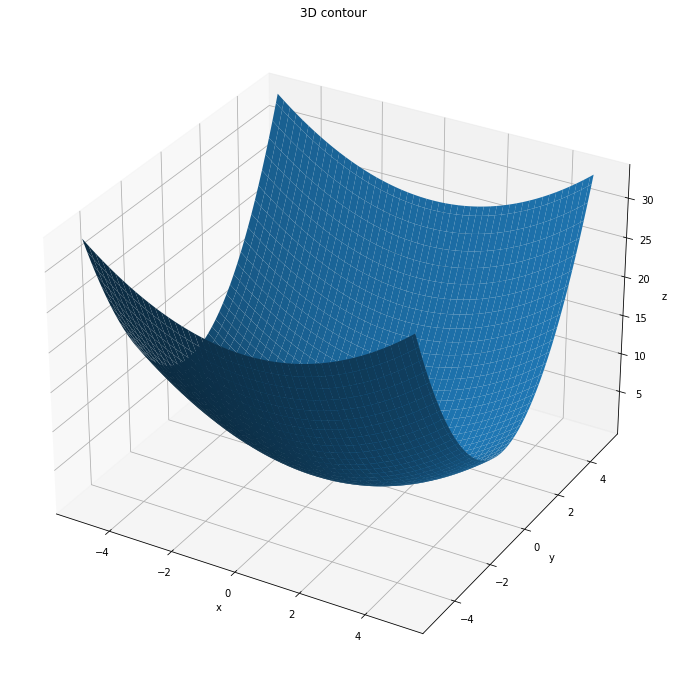

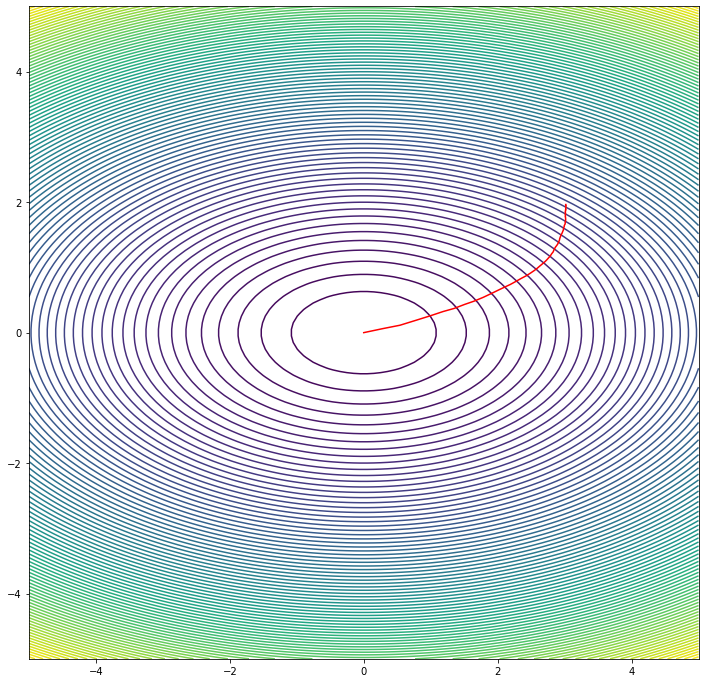

In [23]:
x2 = np.linspace(-5, 5, 100)
y2 = np.linspace(-5, 5, 100)
Xm,Ym = np.meshgrid(x2,y2)
Z = (A[0,0] * Xm**2 + (A[0,1] + A[1,0]) * Xm * Ym + A[1,1] * Ym**2)/2
X_array = np.reshape(np.array(z_list),newshape=(np.array(z_list).shape[0],2))

figure = plt.figure(figsize=[12,12])
ax = figure.gca(projection='3d')
ax.plot_surface(Xm, Ym, Z)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_title('3D contour')

figure2 = plt.figure(figsize=[12,12])
plt.contour(Xm, Ym, Z,100)
plt.plot(X_array[:,0], X_array[:,1],"r-")
plt.show()

# Comment on the number of iterations.
For step-length = 0.01, the values of p and q calculated using SGD is varies alot from the values of p and q calculated uing built-in linear regression function.
Whereas for stop-lenth=0.1, the values of p and q calculated using SGD is very close to the values of p and q calculated using built-in linear regression function. 

Also for step-length=0.01, the value of MSE continues to decrease linearly in each iterations
where as for step-lenth=0.1, the value of MSE doesn't change much after 40th interation.

Hence, we can conclude that for large value of step-length, SGD gives more accurate value of p and q.

# (2.3) Gradient Descent Implementation and Comparison of result of Gradient Descent and Vanilla SGD

Using Steepest Descent Method: 
For the initial guess z0 = [0,0].T  : 
The solution z* =([2.03308447],[3.01365711]) and 
The number of iterations to converge is 245



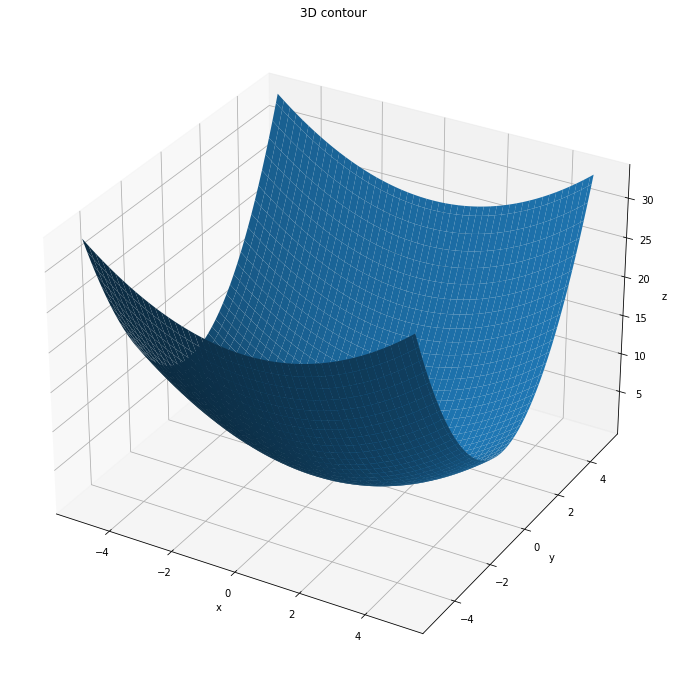

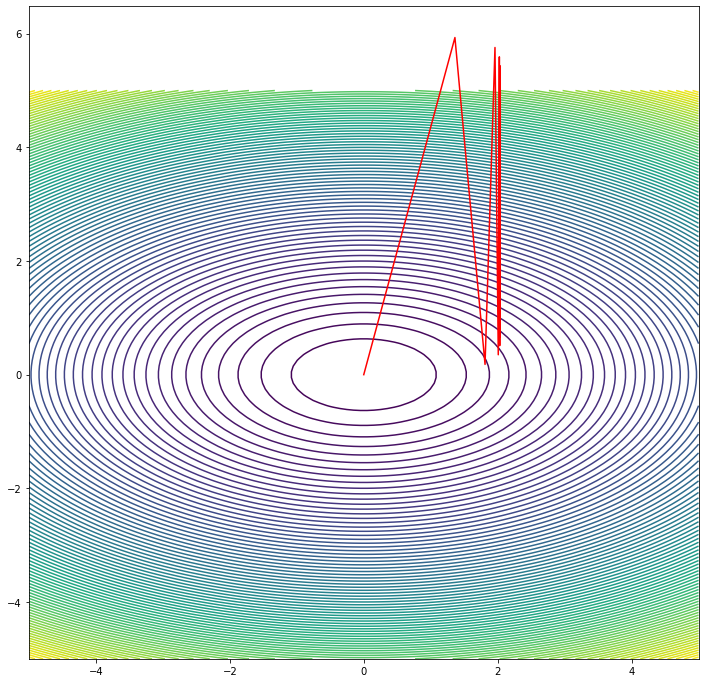

In [24]:
z0 = np.array([[0,0]]).T
p = -df1(z0)
counter = 0
alpha_bar = 10
alpha = Compute_StepLength1(z0, alpha_bar, p)
z_list = [z0]
z = z0 + alpha*p
while(norm((z-z0),2)**2 >=10**(-5)):
    z0 = z
    z_list.append(z0)
    p = -df1(z0)
    counter = counter + 1
    alpha_bar = alpha
    alpha = Compute_StepLength1(z0,alpha_bar,p)
    z = z0 + alpha*p
print("Using Steepest Descent Method: \nFor the initial guess z0 = [0,0].T  : \nThe solution z* =({},{}) and \nThe number of iterations to converge is {}\n".format(z[0],z[1],counter+1))
x2 = np.linspace(-5, 5, 100)
y2 = np.linspace(-5, 5, 100)
Xm,Ym = np.meshgrid(x2,y2)
# Z = func(Xm, Ym, A)
Z = (A[0,0] * Xm**2 + (A[0,1] + A[1,0]) * Xm * Ym + A[1,1] * Ym**2)/2
X_array = np.reshape(np.array(z_list),newshape=(np.array(z_list).shape[0],2))


figure = plt.figure(figsize=[12,12])
ax = figure.gca(projection='3d')
ax.plot_surface(Xm, Ym, Z)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_title('3D contour')

figure2 = plt.figure(figsize=[12,12])
plt.contour(Xm, Ym, Z,100)
plt.plot(X_array[:,0], X_array[:,1],"r-")
plt.show()

# Comparison of vanilla Stochastic Descent and Steepest Descent results.

The result from Steepest Descent is more accurate than the Stochastic Descent but it takes 245 iterations to converge while Stochastic Gradient Descent needs only 40 iterations to converge.

# (2.4) Using scikit-learn's implementation of SGD name sklearn.linear_model.SGDRegressor

In [25]:
SGDReg = SGDRegressor(
   max_iter = 1000, tol = 1e-3)
SGDReg.fit(X, y)
# SGDReg.coef_
# SGDReg.intercept_
# SGDReg.t_
Y_pred = SGDReg.predict(X)

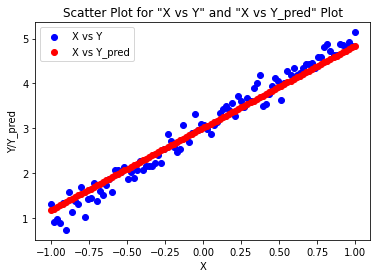

In [26]:
plt.scatter(X,y, c="blue", label='X vs Y')
plt.scatter(X,Y_pred, c='red', label='X vs Y_pred')
plt.xlabel("X")
plt.ylabel("Y/Y_pred")
plt.title("Scatter Plot for \"X vs Y\" and \"X vs Y_pred\" Plot")
plt.legend()
plt.show()